In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, InputLayer
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

In [3]:

# Paths to the dataset
image_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/images"
mask_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/masks"

# Image size (resize all images to this size)
IMG_HEIGHT, IMG_WIDTH = 256, 256
NUM_CLASSES = 8  # Define the number of classes in the SUIM dataset (you can modify this)

# Load the images and masks
def load_data(image_dir, mask_dir):
    images = []
    masks = []
    
    image_filenames = os.listdir(image_dir)
    image_filenames = sorted(image_filenames)
    mask_filenames = os.listdir(mask_dir)
    mask_filenames = sorted(mask_filenames)
    for image_filename in image_filenames:
        # Load image
        img = cv2.imread(os.path.join(image_dir, image_filename))
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        images.append(img)
        
    for mask_filename in mask_filenames:
        # Load corresponding mask
        mask = cv2.imread(os.path.join(mask_dir, mask_filename))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        masks.append(mask)
    
    return np.array(images), np.array(masks)


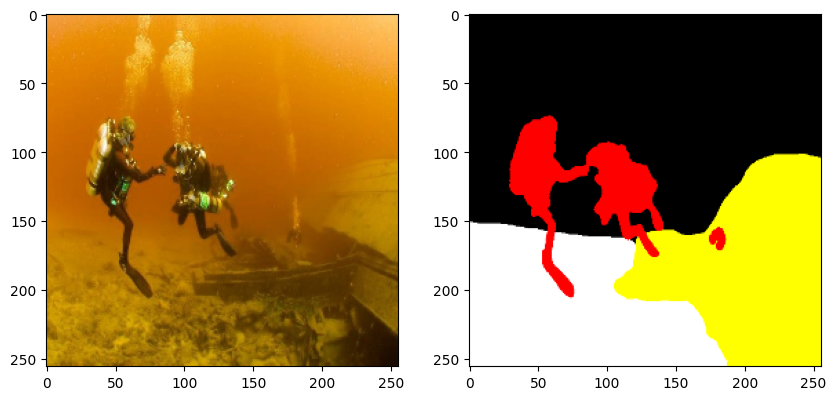

In [4]:
images, masks = load_data(image_dir, mask_dir)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(images[0])
axs[1].imshow(masks[0])
plt.show()

In [5]:
import numpy as np
from PIL import Image
import os

# Define the color-to-class mapping
color_to_class = {
    (0, 0, 0): 0,         # Background (waterbody)
    (0, 0, 255): 1,       # Human divers
    (0, 255, 0): 2,       # Aquatic plants and sea-grass
    (0, 255, 255): 3,     # Wrecks and ruins
    (255, 0, 0): 4,       # Robots (AUVs/ROVs/instruments)
    (255, 0, 255): 5,     # Reefs and invertebrates
    (255, 255, 0): 6,     # Fish and vertebrates
    (255, 255, 255): 7    # Sea-floor and rocks
}

def mask_to_class(mask, color_to_class):
    mask_rgb = np.array(mask)  # Convert mask to a numpy array
    height, width, _ = mask_rgb.shape
    label_mask = np.zeros((height, width, 8), dtype=np.float32)  # Initialize the class label mask with 8 channels

    # Iterate over the color-to-class mapping and assign class ids
    for rgb, class_id in color_to_class.items():
        # Create a mask where the color matches the current RGB tuple
        match = np.all(mask_rgb == rgb, axis=-1)
        label_mask[:, :, class_id] = match.astype(np.float32)  # Assign 1 to the matching pixels in the corresponding channel

    # print(label_mask.shape)
    return label_mask

# Directory to save class masks
output_dir = "/class_masks"
os.makedirs(output_dir, exist_ok=True)
class_masks=[]
# Process all mask images
for i, mask_image in enumerate(masks):
    # Convert the RGB mask to a class index mask
    class_mask = mask_to_class(mask_image, color_to_class)
    class_masks.append(class_mask)

In [6]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, class_masks, test_size=0.2, random_state=42)

# Check the number of samples in each split
print(f"Training samples: {len(X_train)}, Testing samples: {len(X_test)}")

# Now you can use X_train and X_test for training and testing

Training samples: 1220, Testing samples: 305


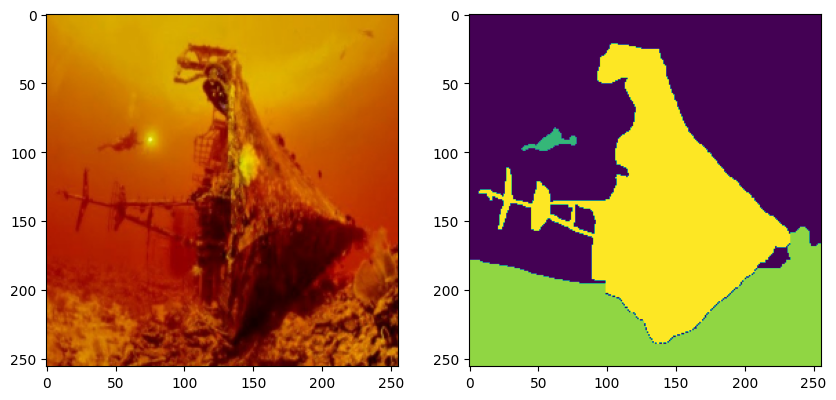

In [7]:
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(X_train[0])
axs[1].imshow(np.argmax(y_train[0],axis=2))
plt.show()

In [8]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

1220
1220
305
305


In [9]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_coef = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice_coef

def bce_dice_loss(y_true, y_pred):
    # Binary Crossentropy
    bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    bce = bce_loss(y_true, y_pred)

    # Dice loss
    dice = dice_loss(y_true, y_pred)

    # Combine the losses
    combined_loss = 0.5 * bce + 0.5 * dice
    return combined_loss

In [10]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add, MaxPooling2D, UpSampling2D, concatenate, Input, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

# Residual block definition with 1x1 convolution for shortcut projection and L2 regularization
def residual_block(x, filters, l2_reg=1e-4):
    shortcut = x

    # If input and output shapes are different, apply 1x1 conv to match dimensions
    if x.shape[-1] != filters:
        shortcut = Conv2D(filters, (1, 1), padding='same', kernel_regularizer=l2(l2_reg))(shortcut)

    x = Conv2D(filters, (3, 3), padding='same', kernel_regularizer=l2(l2_reg))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, (3, 3), padding='same', kernel_regularizer=l2(l2_reg))(x)
    x = BatchNormalization()(x)

    # Adding the shortcut (skip connection)
    x = Add()([x, shortcut])
    x = Activation('relu')(x)

    return x

# Encoder block (Downsampling) with Dropout for regularization
def encoder_block(x, filters, l2_reg=1e-4, dropout_rate=0.3):
    res = residual_block(x, filters, l2_reg)
    pool = MaxPooling2D((2, 2))(res)
    res = Dropout(dropout_rate)(res)  # Add dropout after the residual block
    return res, pool

# Decoder block (Upsampling)
def decoder_block(x, skip_features, filters, l2_reg=1e-4):
    x = UpSampling2D((2, 2))(x)
    x = concatenate([x, skip_features])
    x = Conv2D(filters, (3, 3), padding='same', kernel_regularizer=l2(l2_reg))(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

# ResUNet model
def build_resunet(input_shape, num_classes, l2_reg=1e-4, dropout_rate=0.3):
    inputs = Input(input_shape)

    # Encoder: Downsampling with residual blocks
    res1, pool1 = encoder_block(inputs, 64, l2_reg, dropout_rate)
    res2, pool2 = encoder_block(pool1, 128, l2_reg, dropout_rate)
    res3, pool3 = encoder_block(pool2, 256, l2_reg, dropout_rate)
    res4, pool4 = encoder_block(pool3, 512, l2_reg, dropout_rate)

    # Bridge
    bridge = residual_block(pool4, 1024, l2_reg)

    # Decoder: Upsampling with skip connections
    dec4 = decoder_block(bridge, res4, 512, l2_reg)
    dec3 = decoder_block(dec4, res3, 256, l2_reg)
    dec2 = decoder_block(dec3, res2, 128, l2_reg)
    dec1 = decoder_block(dec2, res1, 64, l2_reg)

    # Output layer for segmentation
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(dec1)

    model = Model(inputs, outputs)
    return model

# Define input shape and number of classes
input_shape = (256, 256, 3)
num_classes = 8

# Build the improved ResUNet model
resunet_model = build_resunet(input_shape, num_classes)

# Compile the model with categorical cross-entropy and Adam optimizer
resunet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks: Early Stopping and ReduceLROnPlateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

# Model summary
resunet_model.summary()



Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_14       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_14[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 256, 256,  │        256 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_5 (Add)         │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_20[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_15       │ (None, 256, 256,  │          0 │ add_5[0][0]       │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 128, 128,  │          0 │ activation_15[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_24[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_16       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 128, 128,  │    147,584 │ activation_16[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_25[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 128, 128,  │      8,320 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 28,963,208 (110.49 MB)

 Trainable params: 28,953,352 (110.45 MB)

 Non-trainable params: 9,856 (38.50 KB)

In [11]:
y_train = np.array(y_train).reshape((1220, 256, 256, 8))

In [12]:
y_test =np.array(y_test).reshape((305, 256, 256, 8))

In [13]:
# Train the model
# print(X_train.shape,y_train.shape)
history = resunet_model.fit(X_train, y_train, epochs=100, batch_size=16, validation_data=(X_test, y_test), callbacks=[early_stopping, reduce_lr])


Epoch 1/100


I0000 00:00:1729320827.375535      94 service.cc:145] XLA service 0x7d1b98001f50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729320827.375631      94 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1729320876.431942      94 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_divide_multiply_subtract_fusion_1', 4 bytes spill stores, 4 bytes spill loads

I0000 00:00:1729320876.462782      94 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


77/77 ━━━━━━━━━━━━━━━━━━━━ 120s 782ms/step - accuracy: 0.4407 - loss: 1.9455 - val_accuracy: 0.4812 - val_loss: 2.0945 - learning_rate: 0.0010
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 29s 378ms/step - accuracy: 0.5632 - loss: 1.3037 - val_accuracy: 0.5941 - val_loss: 1.2532 - learning_rate: 0.0010
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 29s 378ms/step - accuracy: 0.5687 - loss: 1.2480 - val_accuracy: 0.5946 - val_loss: 1.2754 - learning_rate: 0.0010
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 29s 380ms/step - accuracy: 0.5891 - loss: 1.2014 - val_accuracy: 0.5960 - val_loss: 1.2291 - learning_rate: 0.0010
Epoch 5/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 29s 381ms/step - accuracy: 0.5935 - loss: 1.1744 - val_accuracy: 0.6017 - val_loss: 1.1840 - learning_rate: 0.0010
Epoch 6/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 29s 377ms/step - accuracy: 0.5954 - loss: 1.1803 - val_accuracy: 0.5894 - val_loss: 1.2019 - learning_rate: 0.0010
Epoch 7/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 29s 378ms/step - accuracy: 0.5973 - loss: 1.1637

10/10 ━━━━━━━━━━━━━━━━━━━━ 46s 2s/step - accuracy: 0.7242 - loss: 0.8613 
Test Accuracy: 0.7168
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 348ms/step


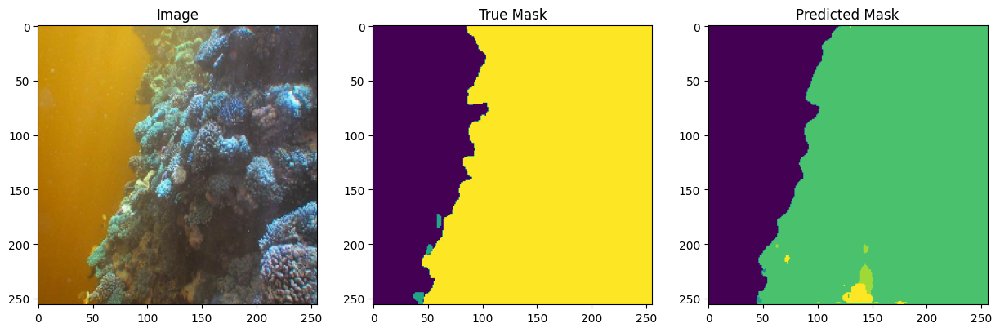

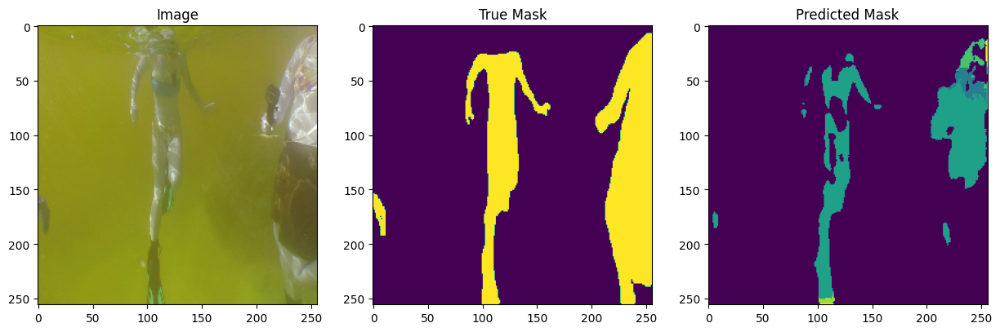

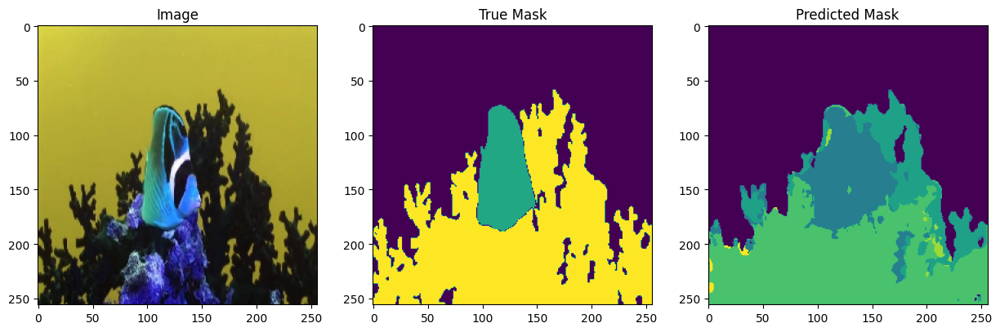

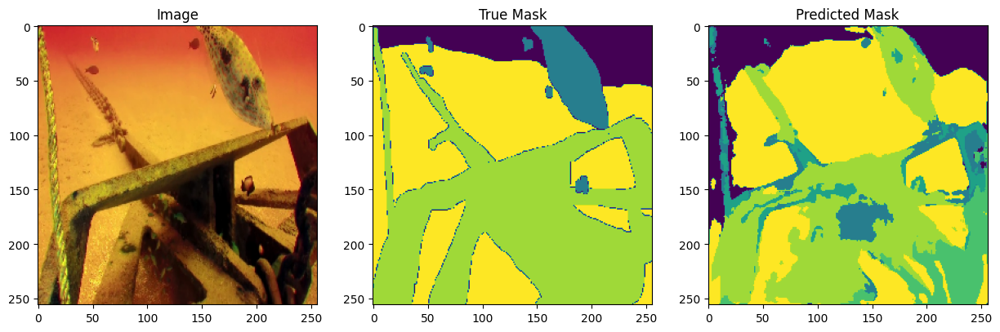

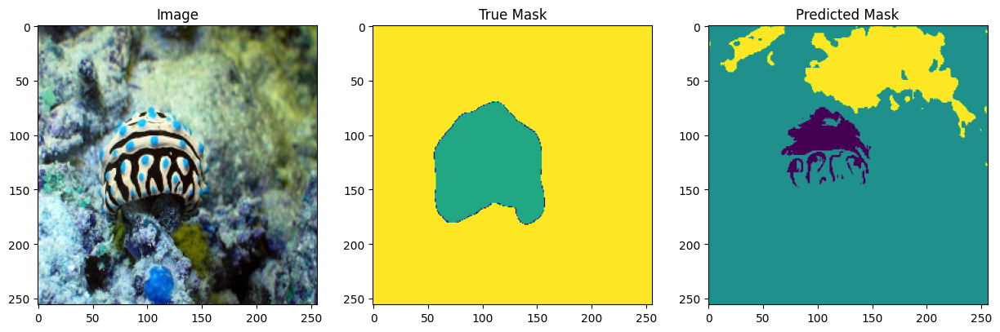

...

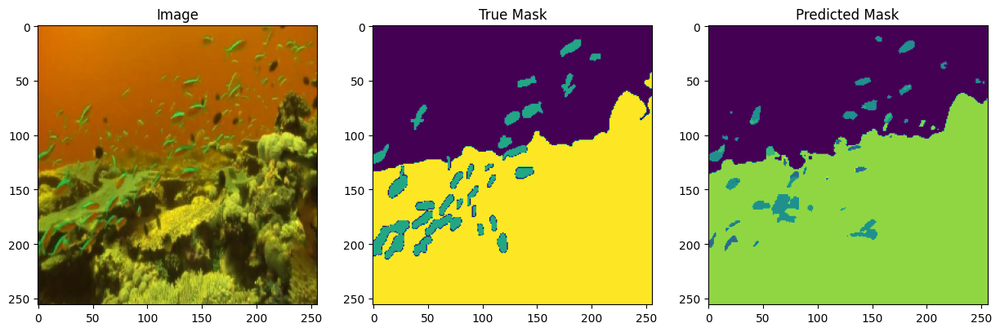

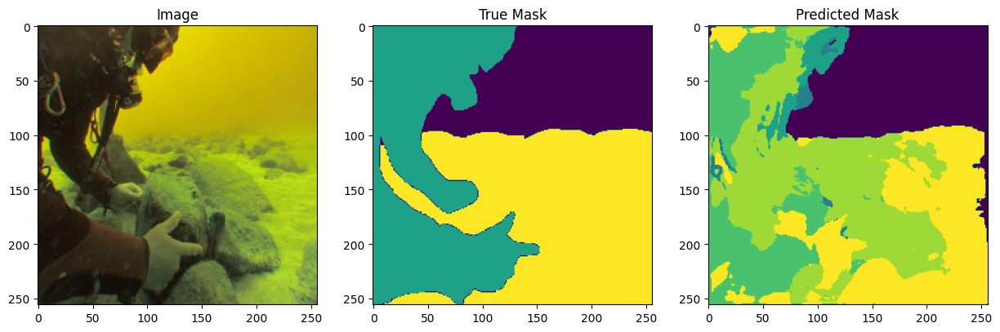

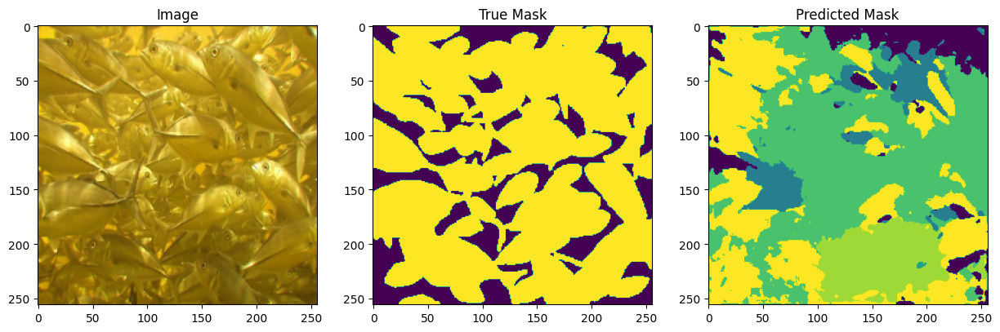

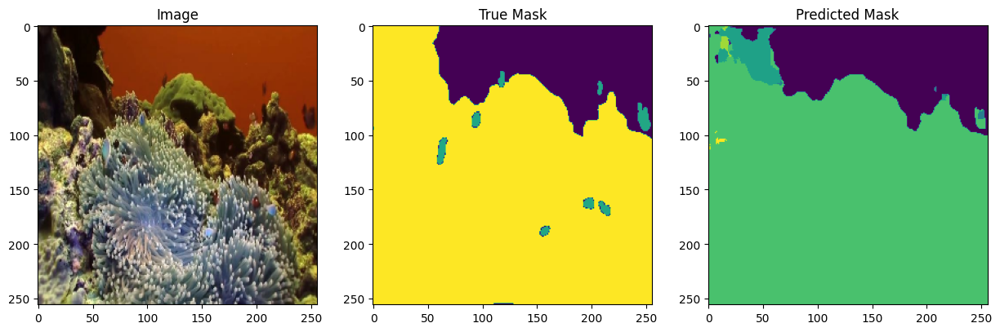

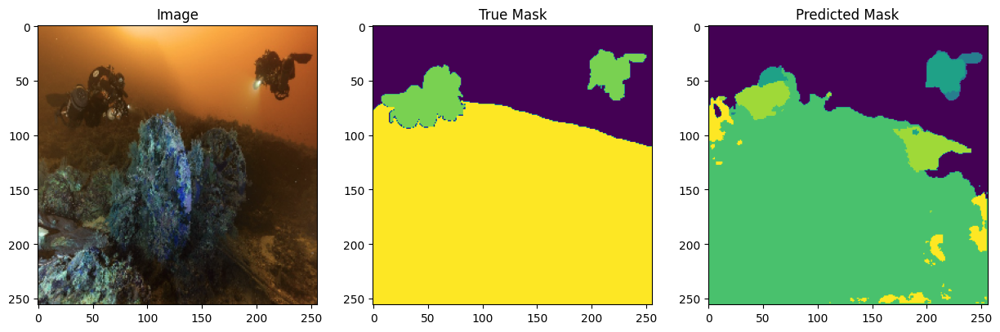

In [14]:
# Evaluate the model
loss, acc = resunet_model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# Predict the masks for the test set
y_pred = resunet_model.predict(X_test)

# Plotting function for results (image, true mask, and predicted mask)
def plot_sample(image, mask_true, mask_pred):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(image)
    axs[0].set_title("Image")
    
    axs[1].imshow(np.argmax(mask_true, axis=2))
    axs[1].set_title("True Mask")
    
    axs[2].imshow(np.argmax(mask_pred, axis=2))
    axs[2].set_title("Predicted Mask")
    
    plt.show()

# Visualize the results
for i in range(50):
    sample_img = X_test[i]
    sample_true_mask = y_test[i]
    sample_pred_mask = y_pred[i]
    
    plot_sample(sample_img, sample_true_mask, sample_pred_mask)


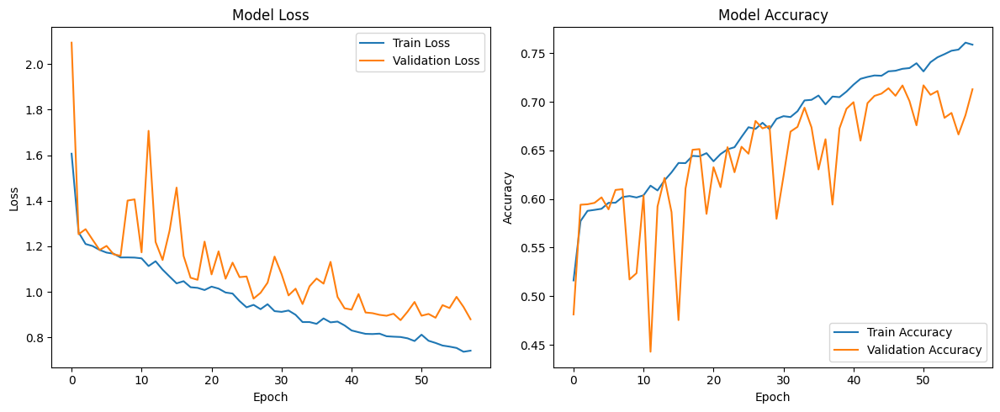

In [15]:
import matplotlib.pyplot as plt

def plot_loss_accuracy(history):
    # Plot training & validation loss values
    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# Example usage
# history = model.fit(...)  # Assuming you have trained the model and history is returned
plot_loss_accuracy(history)
